In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

In [2]:
#Case specific parameters. Change to evaluate a different emulator or a different pipeline
testset_data = '../data/data/data/gas_tri_256/datatest.npy'
results_emu = './results_emu/vr_256/1980.npy'
testset_params = '../data/data/data/gas_tri_256/testpara.csv'
component_sim = 0
component_emu = 0
resolution = 256
all_emulations = np.load('all_emulations.npy')

# Load data

In [3]:
#load the emulator results and the simulations
#mask them

testset = np.load(testset_data)[:,[2,1],::-1]
params = pd.read_csv(testset_params, index_col=0)
params

,InvStokes1,Alpha,AspectRatio,FlaringIndex,PlanetMass,SigmaSlope,nx,rout,ny
0,154.881662,0.001479,0.04435,0.09975,0.000327,0.6995,708.0,3,228.0
1,32.359366,0.000234,0.03525,0.25025,0.002786,1.0005,891.0,3,287.0
2,37.153523,0.002818,0.08635,0.04375,0.005188,0.5875,600.0,5,242.0
3,107.151931,0.001175,0.06045,0.01575,0.000031,0.5315,600.0,3,193.0
4,588.843655,0.006166,0.08565,0.30275,0.000610,1.1055,600.0,3,193.0
...,...,...,...,...,...,...,...,...,...
290,467.735141,0.000933,0.08915,0.23975,0.000010,0.9795,600.0,3,193.0
291,223.872114,0.003890,0.09895,0.34125,0.000027,1.1825,600.0,3,193.0
294,22.387211,0.001778,0.07235,0.30275,0.000164,1.1055,600.0,3,193.0
297,134.896288,0.008128,0.04155,0.09625,0.000124,0.6925,756.0,3,243.0


In [4]:
xy = np.linspace(-3,3,256)
xx, yy = np.meshgrid(xy, xy)
rr = np.sqrt(xx**2+yy**2)
phi = np.arctan2(yy, xx)

mask1 = (rr>0.5) & (rr<2)
mask2 = (rr>0.7) & (rr<1.3) & (phi>-0.2) & (phi<0.2)

Text(0.5, 1.0, 'Mask 2')

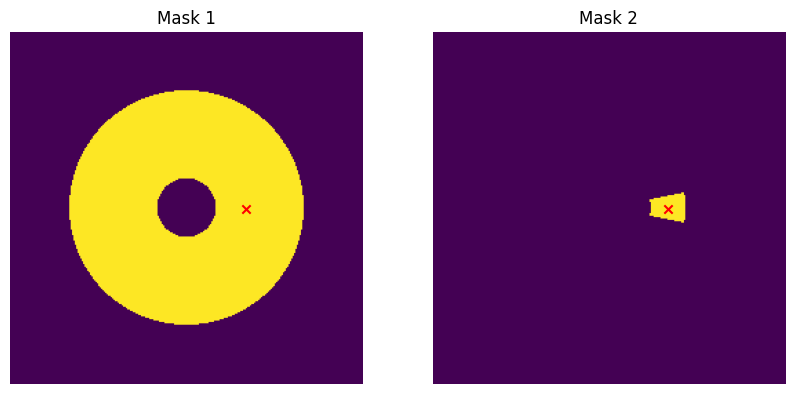

In [5]:
fig, axs = plt.subplots(1, 2, figsize=(10,5))
axs[0].imshow(mask1)
axs[0].scatter(128+128/3, 128, color='red', marker='x')
axs[1].imshow(mask2)
axs[1].scatter(128+128/3, 128, color='red', marker='x')
axs[0].axis('off')
axs[1].axis('off')
axs[0].set_title('Mask 1')
axs[1].set_title('Mask 2')

In [33]:
from skimage.metrics import structural_similarity as ssim_m

mse = []
msre = []
msre2=[]
ssim = []

data_range = [np.max(testset[:,i]*mask1) - np.min(testset[:, i]*mask1) for i in range(testset.shape[1])]
for mask in [mask1, mask2]:
    mse.append((((testset-all_emulations)*mask.reshape(1,1,256,256))**2))
    msre.append((((testset-all_emulations)*mask.reshape(1,1,256,256))**2).mean(axis=(-1,-2))/((testset*mask)**2).mean(axis=(-1,-2)))
    msre2.append((((testset-all_emulations)*mask.reshape(1,1,256,256))**2)**0.5/(np.abs(testset*mask)))
    ssim.append([[ssim_m(testset[i,j]*mask, all_emulations[i,j]*mask, data_range=data_range[j]) for i in range(testset.shape[0])] for j in range(testset.shape[1])])

ssim = np.array(ssim)
mse = np.array(mse)
msre = np.array(msre)
msre2 = np.nan_to_num(msre2)

/scratch/ipykernel_1570647/1170521195.py:12: RuntimeWarning: invalid value encountered in divide
  msre2.append((((testset-all_emulations)*mask.reshape(1,1,256,256))**2)**0.5/(np.abs(testset*mask)))


# mse

In [18]:
mse.shape

(2, 233, 2)

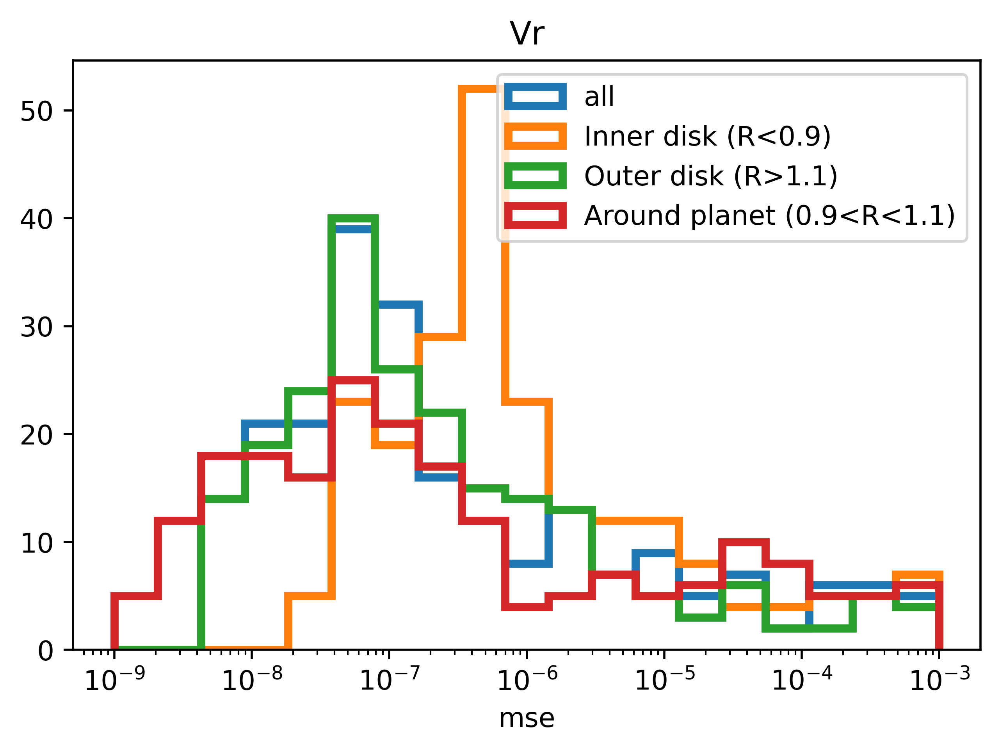

In [6]:
bins = np.logspace(-9,-3,20)
plt.hist(mses.reshape(-1), label='all', bins=bins, histtype='step', linewidth=3)
plt.hist(mses_in.reshape(-1), label='Inner disk (R<0.9)', bins=bins, histtype='step',linewidth=3)
plt.hist(mses_out.reshape(-1), label='Outer disk (R>1.1)', bins=bins, histtype='step', linewidth=3)
plt.hist(mses_p.reshape(-1), label='Around planet (0.9<R<1.1)', bins=bins, histtype='step', linewidth=3)
plt.xlabel('mse')
plt.legend()
plt.xscale('log')
plt.title('Vr')
plt.gcf().set_dpi(500)

# mse with respect to parameters

In [7]:
tmass_un = 3*params['PlanetMass']/(2*params['AspectRatio']**3)

In [21]:
msre2.shape

(2, 233, 2, 256, 256)

In [37]:
velsq.shape

(233, 2)

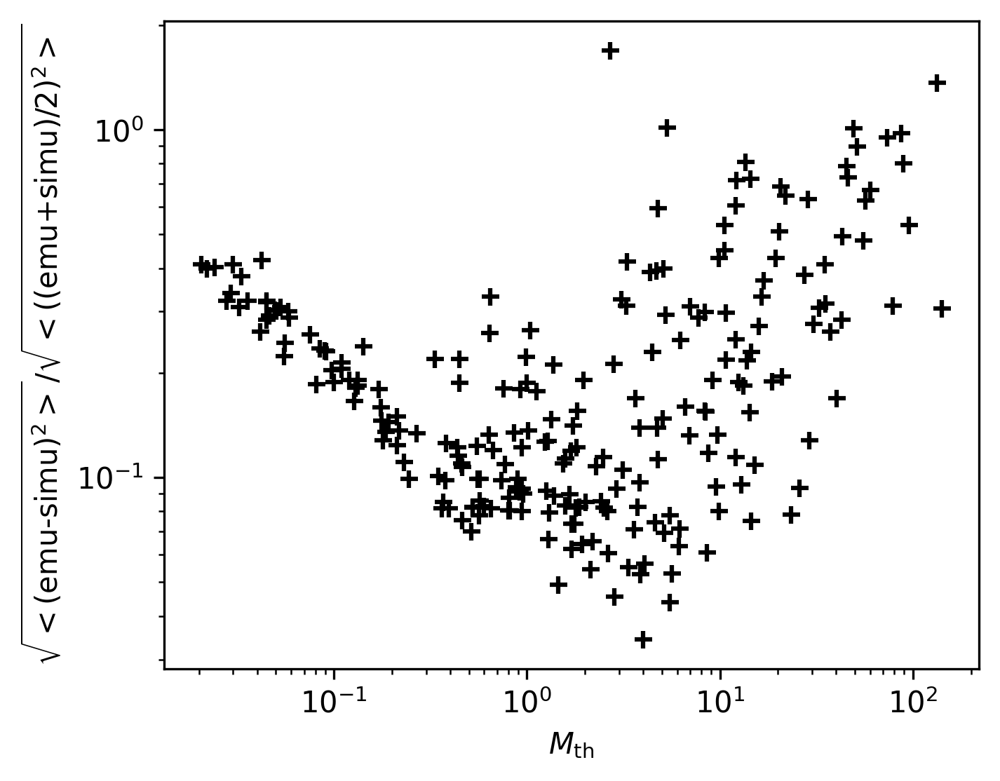

In [59]:
mse_mean = np.sqrt(mse[1,:,0].sum(axis=(-1,-2))/mask2.sum())
velsq = np.sqrt((((0.5*(testset+all_emulations))*mask2)**2).sum(axis=(-1,-2))/mask2.sum())
plt.scatter(tmass_un, mse_mean/velsq[:,0], marker='+', color='black')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('$M_\\text{th}$')
plt.ylabel('$\sqrt{<(\\text{emu-simu})^2>}/\sqrt{<((\\text{emu+simu})/2)^2>}$')
plt.gcf().set_dpi(300)
plt.gcf().set_size_inches(5,4)
plt.savefig('plots/REvsMTH.pdf', bbox_inches='tight')

In [39]:
params['Mth'] = params["PlanetMass"]/(2*params["AspectRatio"]**3)/3

Text(0.5, 1.0, '$v_r$')

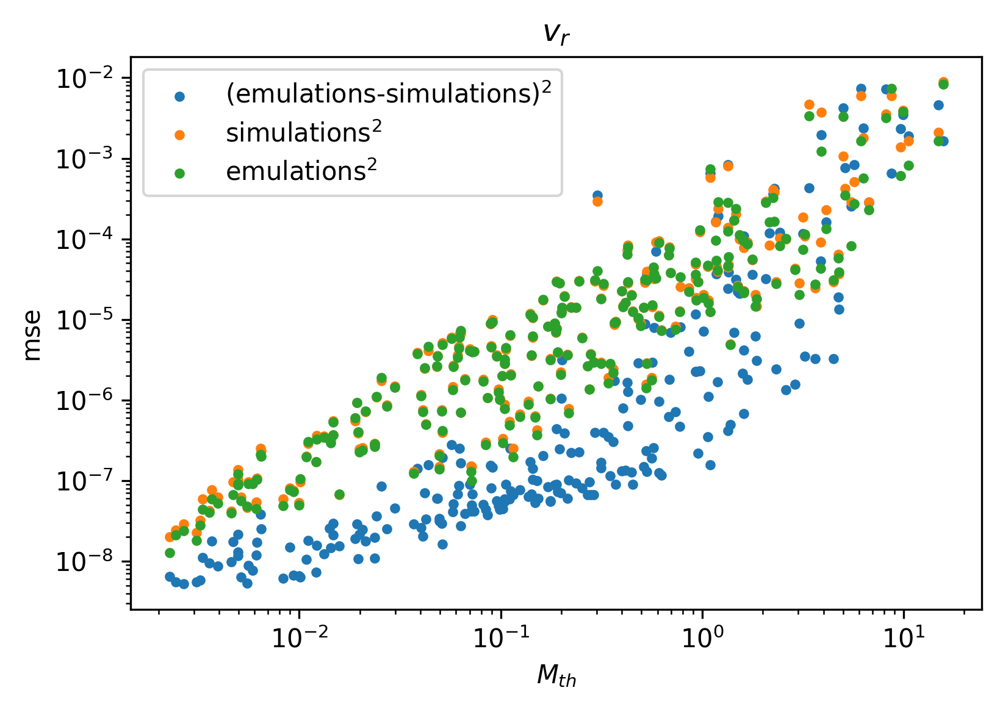

In [41]:
plt.scatter(params['Mth'], mses, marker='.', label='(emulations-simulations)$^2$')
plt.scatter(params['Mth'], ((testset[:,2]*mask)**2).mean(axis=(1,2)), marker='.', label='simulations$^2$')
plt.scatter(params['Mth'], ((results[:,0]*mask)**2).mean(axis=(1,2)), marker='.', label='emulations$^2$')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('$M_{th}$')
plt.ylabel('mse')
plt.gcf().set_dpi(300)
plt.legend()
plt.title('$v_r$')

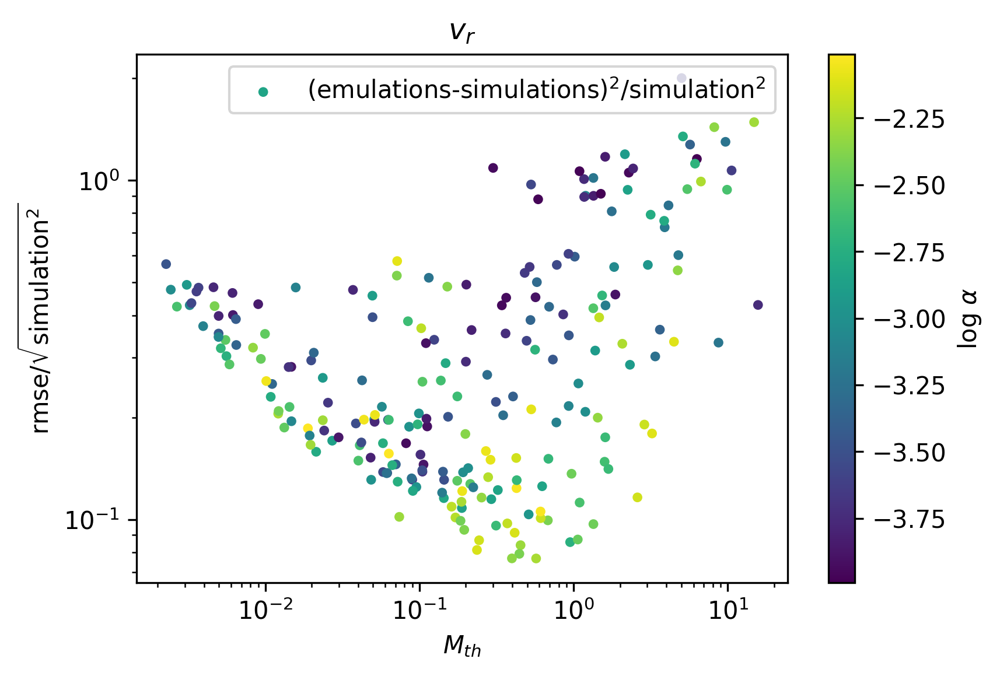

In [14]:
plt.scatter(params["PlanetMass"]/(2*params["AspectRatio"]**3)/3, mses**0.5/np.sqrt(((testset[:,2]*mask)**2).mean(axis=(1,2))), marker='.', label='(emulations-simulations)$^2$/simulation$^2$', c=np.log10(params['Alpha']))
#plt.scatter(params['PlanetMass'], ((testset[:,2]*mask)**2).mean(axis=(1,2)), marker='.', label='simulations$^2$')
#plt.scatter(params['PlanetMass'], ((results[:,0]*mask)**2).mean(axis=(1,2)), marker='.', label='emulations$^2$')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('$M_{th}$')
plt.ylabel('rmse/$\sqrt{\\text{simulation}^2}$')
plt.gcf().set_dpi(300)
plt.legend()
plt.title('$v_r$')
plt.colorbar(label='log $\\alpha$')
plt.show()

In [15]:
id = 0

fig, axs = plt.subplots(10,10, figsize=(60,50))
axs = axs.flatten()

for id in range(0,100):
    r = np.linspace(-3,3,256)
    axs[id].scatter(r, testset[id, 2, 128], marker='.', label='simulation')
    axs[id].scatter(r, results[id, 0, 128], marker='+', linewidth=1, label='emulation')
    axs[id].set_xlim(0.4, 3)
    axs[id].axvline(1, linestyle='dashed', label='planet position')
    axs[id].set_ylabel('vr')
    axs[id].set_xlabel('r')
    axs[id].set_title(f'slice at $\phi=0$ \n sim id:{id}, $M_p/M\star$: {params.loc[id, "PlanetMass"]:.2e}, $M_\\text' + '{th}' + f'$: {params.loc[id, "PlanetMass"]/(2*params.loc[id, "AspectRatio"]**3/3):.2e}, $\\alpha$: {params.loc[id, "Alpha"]:.2e}')
    axs[id].legend()
    
fig.set_dpi(300)
plt.tight_layout()
plt.savefig('gallery_slices.pdf', dpi=300, bbox_inches='tight')

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from ipywidgets import interact

# Assuming testset, results, params, mses already exist

r = np.linspace(-3, 3, 256)

def plot_id(idx):
    plt.figure(figsize=(6,4))

    plt.scatter(r, testset[idx, 2, 128], marker='.', label='simulation')
    plt.scatter(r, results[idx, 0, 128], marker='+', linewidth=1, label='emulation')

    plt.xlim(0.4, 3)
    plt.axvline(1, linestyle='dashed', label='planet position')
    plt.ylabel('vr')
    plt.xlabel('r')

    Mp = params.loc[idx, "PlanetMass"]
    H = params.loc[idx, "AspectRatio"]
    alpha = params.loc[idx, "Alpha"]
    mse = mses[idx]
    Mth = Mp / (2 * H**3 / 3)

    plt.title(
        f"slice at $\\phi=0$\n"
        f"sim id:{idx}, $M_p/M_\\star$: {Mp:.2e},\n"
        f"$M_{{th}}$: {Mth:.2e}, $\\alpha$: {alpha:.2e}, mse: {mse:.2e}"
    )
    plt.gcf().set_dpi(300)
    plt.legend()
    plt.tight_layout()
    plt.show()

# Slider for id
interact(plot_id, idx=widgets.IntSlider(min=0, max=testset.shape[0]-1, step=1, value=71, description='id'));


interactive(children=(IntSlider(value=71, description='id', max=232), Output()), _dom_classes=('widget-interac…

##### Training dataset dynamic range


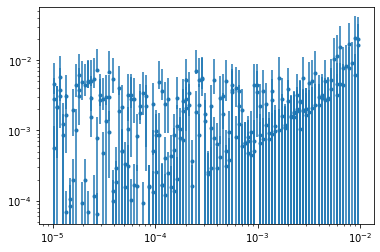

In [9]:
val = ((testset[:,1]-(rr.reshape(1,256,256)**-0.5))*mask)
val = np.abs(val)
yerr = ((np.percentile(val, 90, axis=(1,2))-np.percentile(val, 50, axis=(1,2))), 
(np.percentile(val, 50, axis=(1,2))-np.percentile(val, 10, axis=(1,2))))
plt.errorbar(params['PlanetMass'], np.percentile(val, 50, axis=(1,2)), yerr=yerr, fmt='.')
plt.xscale('log')
plt.yscale('log')

# MRE

/tmp/ipykernel_27138/2487551397.py:2: RuntimeWarning: divide by zero encountered in divide
  mres = (np.nan_to_num(np.abs((testset[:,component_sim]-results[:,component_emu])/testset[:,component_sim]))*mask).mean(axis=(1,2))
/tmp/ipykernel_27138/2487551397.py:3: RuntimeWarning: divide by zero encountered in divide
  mres_in = (np.nan_to_num(np.abs((testset[:,component_sim]-results[:,component_emu])/testset[:,component_sim]))*mask_in).sum(axis=(1,2))/np.sum(mask_in)
/tmp/ipykernel_27138/2487551397.py:4: RuntimeWarning: divide by zero encountered in divide
  mres_out = (np.nan_to_num(np.abs((testset[:,component_sim]-results[:,component_emu])/testset[:,component_sim]))*mask_out).sum(axis=(1,2))/np.sum(mask_out)
/tmp/ipykernel_27138/2487551397.py:5: RuntimeWarning: divide by zero encountered in divide
  mres_p = (np.nan_to_num(np.abs((testset[:,component_sim]-results[:,component_emu])/testset[:,component_sim]))*mask_p).sum(axis=(1,2))/np.sum(mask_p)


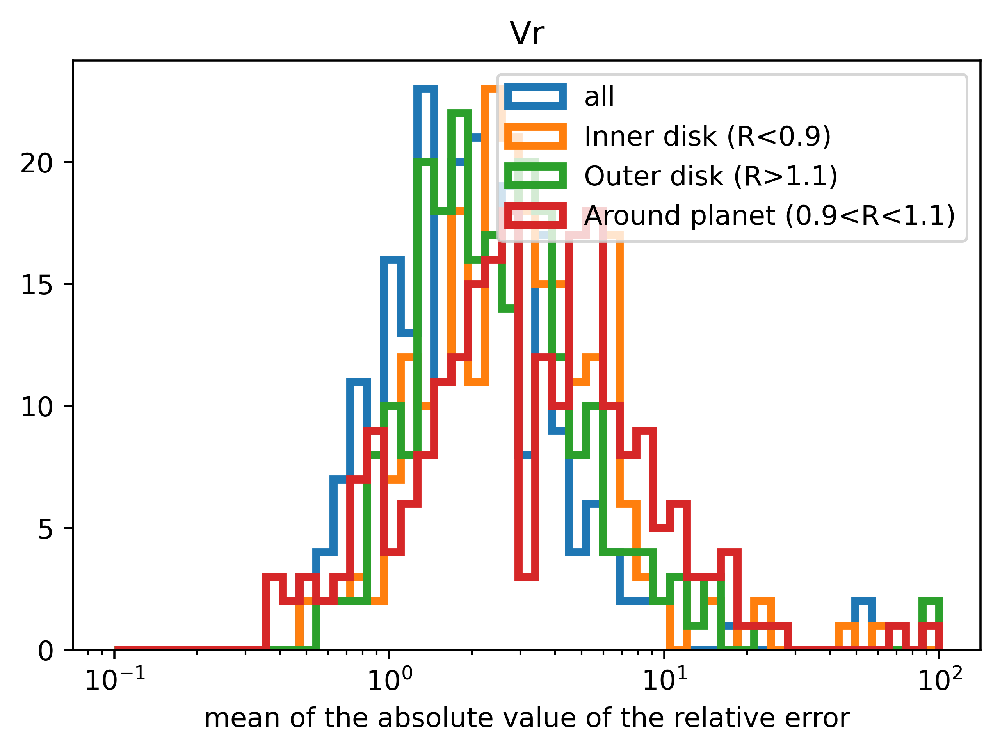

In [32]:
bins = np.logspace(-1,2,50)
mres = (np.nan_to_num(np.abs((testset[:,component_sim]-results[:,component_emu])/testset[:,component_sim]))*mask).mean(axis=(1,2))
mres_in = (np.nan_to_num(np.abs((testset[:,component_sim]-results[:,component_emu])/testset[:,component_sim]))*mask_in).sum(axis=(1,2))/np.sum(mask_in)
mres_out = (np.nan_to_num(np.abs((testset[:,component_sim]-results[:,component_emu])/testset[:,component_sim]))*mask_out).sum(axis=(1,2))/np.sum(mask_out)
mres_p = (np.nan_to_num(np.abs((testset[:,component_sim]-results[:,component_emu])/testset[:,component_sim]))*mask_p).sum(axis=(1,2))/np.sum(mask_p)
plt.hist(mres.reshape(-1), label='all', bins=bins, histtype='step', linewidth=3)
plt.hist(mres_in.reshape(-1), label='Inner disk (R<0.9)', bins=bins, histtype='step',linewidth=3)
plt.hist(mres_out.reshape(-1), label='Outer disk (R>1.1)', bins=bins, histtype='step', linewidth=3)
plt.hist(mres_p.reshape(-1), label='Around planet (0.9<R<1.1)', bins=bins, histtype='step', linewidth=3)
plt.xlabel('mean of the absolute value of the relative error')
plt.legend()
#plt.yscale('log')
plt.xscale('log')
plt.title('Vr')

plt.gcf().set_dpi(500)
plt.show()

Text(0.5, 1.0, '$v_r$')

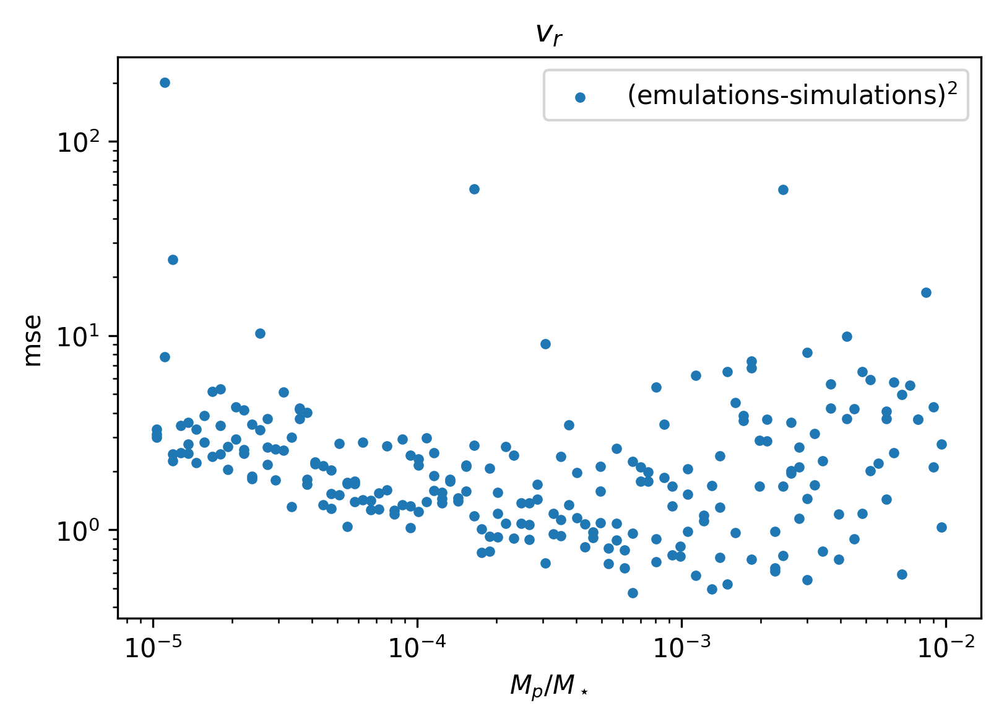

In [29]:
plt.scatter(params['PlanetMass'], mres, marker='.', label='(emulations-simulations)$^2$')
#plt.scatter(params['PlanetMass'], ((testset[:,2]*mask)**2).mean(axis=(1,2)), marker='.', label='simulations$^2$')
#plt.scatter(params['PlanetMass'], ((results[:,0]*mask)**2).mean(axis=(1,2)), marker='.', label='emulations$^2$')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('$M_p/M_\star$')
plt.ylabel('mse')
plt.gcf().set_dpi(300)
plt.legend()
plt.title('$v_r$')

# Slices at fixed azimuth

In [5]:
from scipy.interpolate import LinearNDInterpolator
def to_polar(data, x, y, r, theta):
    xx, yy = np.meshgrid(x, y)
    rr = np.sqrt(xx**2+yy**2).reshape(-1)
    tt = np.arctan2(yy, xx).reshape(-1)
    new_r, new_t = np.meshgrid(r,theta)
    return LinearNDInterpolator((rr, tt), data.reshape(-1))

id = 0
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact
from IPython.display import display, clear_output

# Simulating a datacube with random values (replace with your actual data)
N = 50  # Number of images
id = 0  # Shape (N, 128, 128)
x = y = np.linspace(-3,3,256)

r = np.linspace(0.4,3, 100)
theta = np.linspace(-np.pi, np.pi, 100)
rr, tt = np.meshgrid(r, theta)
    
def get_interact(id):
    sim_cyl = to_polar(testset[id, 2], x, y, r, theta)
    emu_cyl = to_polar(results[id, 0], x, y, r, theta)
    
    def show_image(theta):
        plt.gcf().set_size_inches(20,10)
        plt.scatter(r, sim_cyl(r, theta), label='simulation')
        plt.scatter(r, emu_cyl(r, theta), label='emulation')
        plt.xlabel('r')
        plt.ylabel('v_r')
        plt.title(f'theta = {theta}')
        plt.legend()
        plt.show()
    
    return interact(show_image, theta=(-np.pi, np.pi))
# Creating an interactive slider
clear_output(wait=True)

interact(get_interact, id=range(233))

interactive(children=(Dropdown(description='id', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15…

<function __main__.get_interact(id)>

# Spiral coordinates

In [58]:
from scipy.integrate import quad

def get_i(beta):
    def f(x):
        w = -5/4-1.5*beta
        return np.abs(1-x**1.5)**1.5*(x**w)
    def i(x):
        return quad(f, 1, x)[0]
    return np.vectorize(i)

In [59]:
import numpy as np
#inputs
#q = 0.5-beta

def phi_kep_w(r, r_p, phi_p, h0, beta):
    q = 0.5-beta
    a = np.sign(r-r_p)*(1/h0)
    b = ((r/r_p)**(q-0.5))/(q-0.5)
    c = -((r/r_p)**(q+1))/(q+1)
    d = -3/((2*q-1)*(q+1))
    return phi_p + a*(b+c+d)

def comp_eta(r, phi, r_p, phi_p, h0, beta):
    q = 0.5-beta
    return 3*(phi-phi_kep_w(r, r_p, phi_p, h0, q))/(2*h0)

def comp_t(r, r_p, h0, beta):
    i = get_i(beta)
    return -3*i(r/r_p)/(2**(5/4)*h0**(5/2))

In [9]:
testset.shape

(233, 3, 256, 256)

In [10]:
from scipy.interpolate import griddata
def on_spiral_coord(x, y, data, eta, t, r_p, phi_p, h0, beta):
    xx, yy = np.meshgrid(x, y)
    rr = np.sqrt(xx**2+yy**2)
    theta = np.arctan2(yy, xx)
    print('computing eta')
    old_eta = comp_eta(rr, theta, r_p, phi_p, h0, beta)
    print('computing t')
    old_t = comp_t(rr, r_p, h0, beta)
    etamg, tmg = np.meshgrid(eta, t)
    print('interpolating')
    return griddata((old_eta, old_t), data, (etamg, tmg))

In [5]:
#example
id = 0
data = testset[id, 2]
x = y = np.linspace(-3,3,256)
eta = np.linspace(-50,50,10)
t = np.linspace(0,10,10)
r_p = 1
phi_p = 0
h0 = params.loc[id, 'AspectRatio']
beta = params.loc[id, 'FlaringIndex']
res = on_spiral_coord(x, y, data, eta, t, r_p, phi_p, h0, beta)

In [18]:
xx, yy = np.meshgrid(x, y)
rr = np.sqrt(xx**2+yy**2)
theta = np.arctan2(yy, xx)
print('computing eta')
old_eta = comp_eta(rr, theta, r_p, phi_p, h0, beta)
print('computing t')
old_t = comp_t(rr, r_p, h0, beta)
etamg, tmg = np.meshgrid(eta, t)
print('interpolating')

computing eta
computing t
interpolating


In [ ]:
griddata((old_eta, old_t), data, (etamg, tmg))

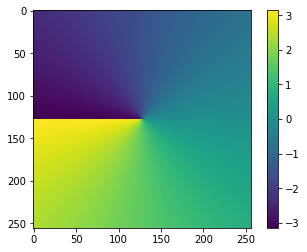

In [72]:
plt.imshow(theta)
plt.colorbar()

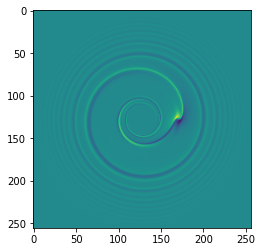

In [73]:
plt.imshow(data)

In [74]:
params.loc[id]

Unnamed: 0        0.000000
InvStokes1      154.881662
Alpha             0.001479
AspectRatio       0.044350
FlaringIndex      0.099750
PlanetMass        0.000327
SigmaSlope        0.699500
nx              708.000000
rout              3.000000
ny              228.000000
Name: 0, dtype: float64

In [11]:
#eta = eta(rr, theta, 1, 0, params.loc[id, 'AspectRatio'], params.loc[id, 'FlaringIndex'])
t = comp_t(rr, 1, params.loc[id, 'AspectRatio'], params.loc[id, 'FlaringIndex'])

TypeError: Invalid shape (10,) for image data

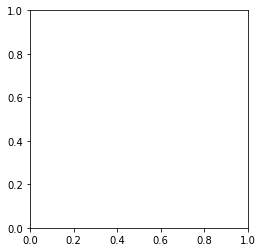

In [12]:
plt.imshow(eta, vmin=-20, vmax=20)
plt.colorbar()

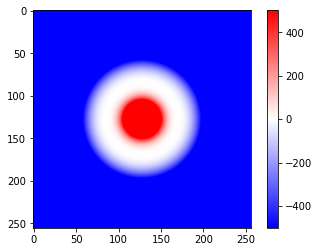

In [16]:
plt.imshow(t, cmap='bwr', vmin=-500, vmax=500)
plt.colorbar()

# res

In [6]:
res = np.load('spcoord_simu.npy')

In [7]:
res.shape

(233, 1, 400, 200)

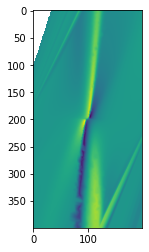

In [8]:
plt.imshow(res[4,0])

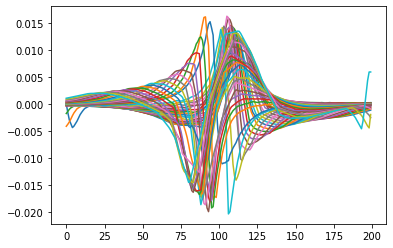

In [13]:
plt.plot(res[10,0,::10,::].T)
#plt.axvline(100)